In [1]:
%config InlineBackend.figure_format='retina'
%matplotlib inline
import pandas, numpy
from sklearn.cross_validation import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
# this wrapper makes it possible to train on subset of features
from rep.estimators import SklearnClassifier

from hep_ml.commonutils import train_test_split
from hep_ml import uboost, gradientboosting as ugb, losses
from k3pi_config import get_mode, config
from k3pi_utilities import variables as vars
from k3pi_utilities import helpers, bdt_utils
from analysis import selection, add_variables
from k3pi_config.modes import MODE, gcm
from analysis import mass_fitting
import matplotlib.pyplot as plt
import numpy as np

/afs/cern.ch/user/d/dmuller/.virtualenvs/k3pi/lib/python2.7/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [2]:
with MODE('MagBoth', 2015, 'RS'):
    mode = gcm()
    features = [f.functor(f.particle) for f in mode.bdt_vars]
    data = mode.get_data(features + [vars.ltime(mode.D0), vars.m(mode.D0), vars.dtf_dm()])
    sel = selection.full_selection()
    data = data[sel]
    add_variables.append_phsp(data)
    uniform_features = [vars.ltime(mode.D0)]
    classifiers = bdt_utils.load_classifiers()
# data = data[sel]
# data = data.append(data, ignore_index=True)

Welcome to ROOTaaS 6.06/02


In [3]:
for f in mode.bdt_vars:
    if f.convert is not None:
        data[f.functor(f.particle)] = f.convert(data[f.functor(f.particle)])

In [4]:
# Random split using sweights
np.random.seed(42)
labels = (np.random.rand(len(data)) < 0.5)
sweights = mass_fitting.get_sweights(mode)
sweights['bkg'] = sweights.rnd + sweights.comb
data['weights'] = (labels)*sweights.sig.values + (~labels)*sweights.bkg.values

In [5]:
data['labels'] = labels

In [6]:
train, test, train_lbl, test_lbl = train_test_split(data, labels, random_state=42)

In [42]:
len(classifiers['KnnFlatnessWeak'].feature_importances_), len(features)

(14, 14)

In [8]:
from rep.report.metrics import RocAuc
report = classifiers.test_on(test, test_lbl, sample_weight=test.weights)

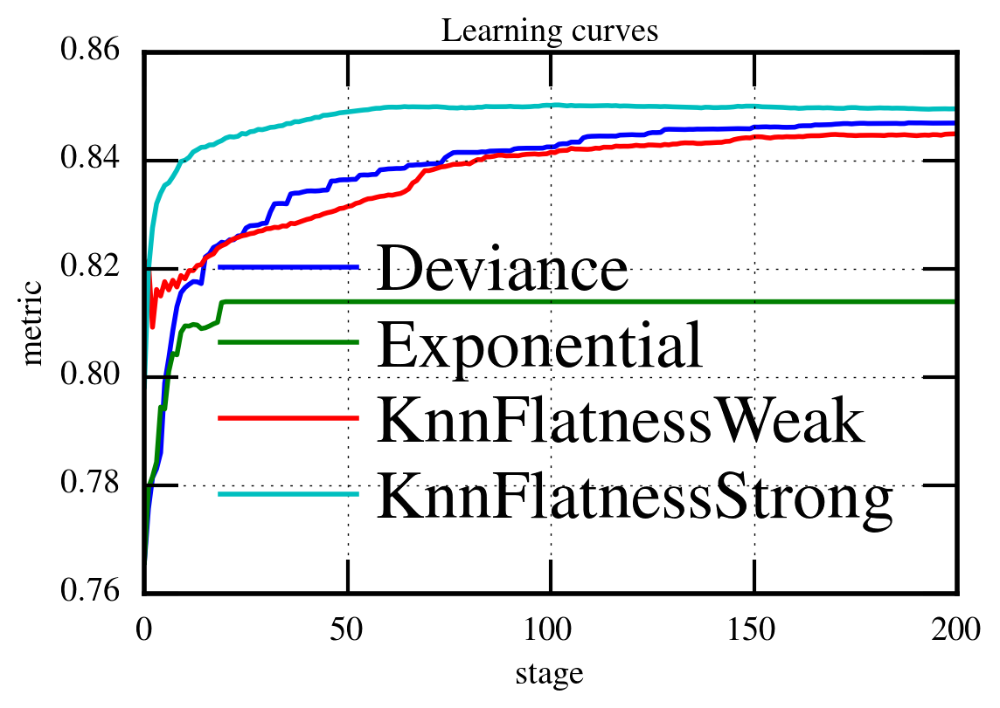

In [9]:
report.learning_curve(RocAuc(), steps=1)

In [13]:
rocauc._plot

<bound method FunctionsPlot._plot of <rep.plotting.FunctionsPlot object at 0x7f8f9ffbecd0>>


variable "rocauc" not defined.

variable "rocauc." not defined.

variable "rocauc" not defined.

variable "rocauc._" not defined.

variable "rocauc" not defined.

variable "rocauc._" not defined.

variable "rocauc" not defined.

variable "rocauc._" not defined.


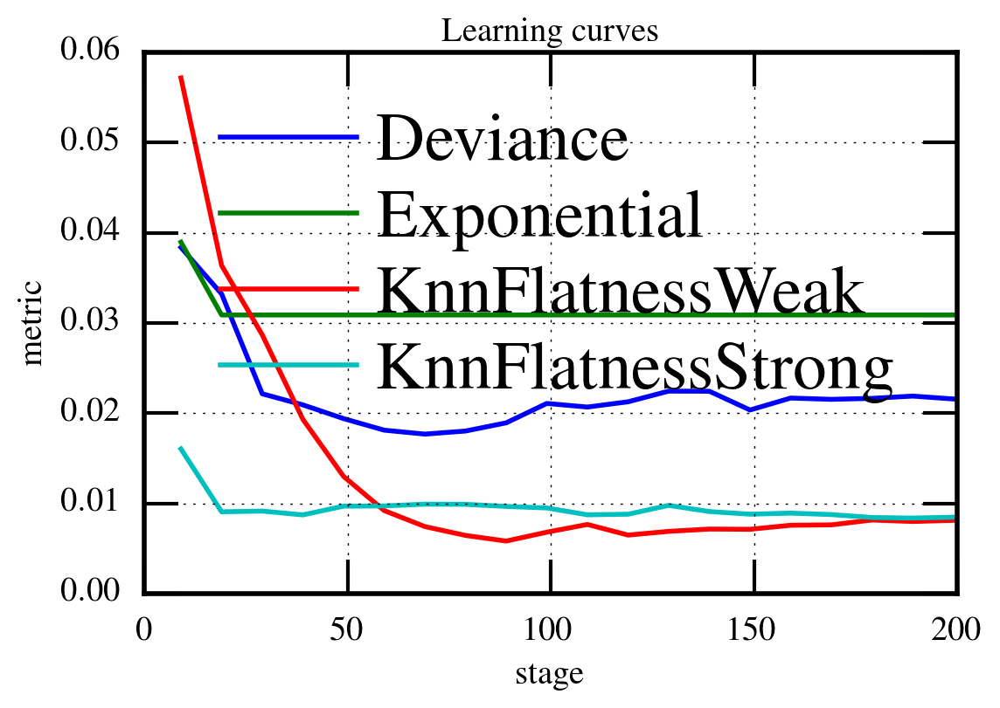

In [10]:
from hep_ml.metrics import BinBasedSDE, KnnBasedCvM
report.learning_curve(BinBasedSDE(uniform_features, uniform_label=1))

/afs/cern.ch/user/d/dmuller/.virtualenvs/k3pi/lib/python2.7/site-packages/rep/utils.py:176: RuntimeWarning: invalid value encountered in sqrt
  err_tnr = numpy.sqrt(tnr * (1 - tnr) * numpy.sum(weight_bck ** 2)) / numpy.sum(weight_bck)
/afs/cern.ch/user/d/dmuller/.virtualenvs/k3pi/lib/python2.7/site-packages/rep/utils.py:177: RuntimeWarning: invalid value encountered in sqrt
  err_tpr = numpy.sqrt(tpr * (1 - tpr) * numpy.sum(weight_sig ** 2)) / numpy.sum(weight_sig)


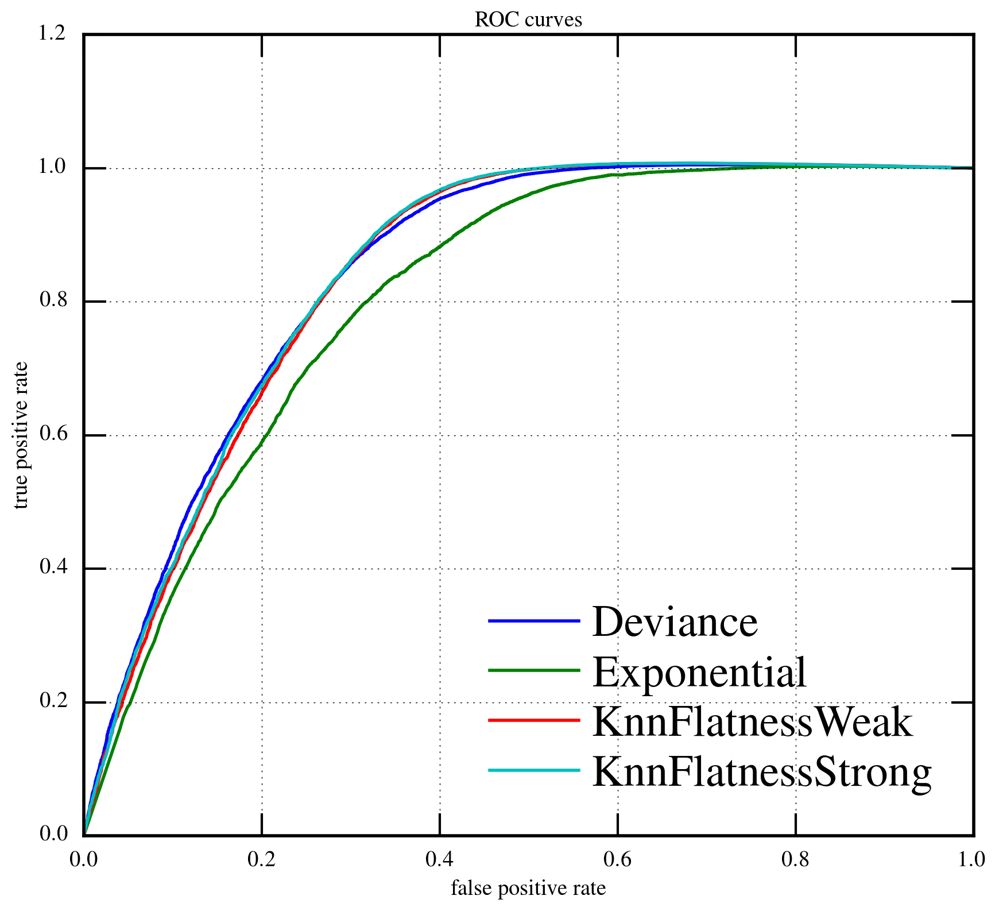

In [11]:
report.roc().plot(new_plot=True, figsize=[10, 9])


In [12]:
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['text.usetex'] = False

report.efficiencies([var.functor(var.particle) for var in mode.spectator_vars], errors=True)

/afs/cern.ch/user/d/dmuller/.virtualenvs/k3pi/lib/python2.7/site-packages/matplotlib/font_manager.py:1288: UserWarning: findfont: Font family [u'serif'] not found. Falling back to Bitstream Vera Sans
  (prop.get_family(), self.defaultFamily[fontext]))


In [24]:
from sklearn.metrics import roc_curve, roc_auc_score

In [12]:
bdt = classifiers['KnnFlatnessWeak']

In [13]:
probs = bdt.predict_proba(test).transpose()[1]

In [41]:
x,y,thr = roc_curve(test_lbl, probs, sample_weight=test.weights)


tab completion not implemented for this context

tab completion not implemented for this context

variable "test" not defined.

variable "test.we)" not defined.


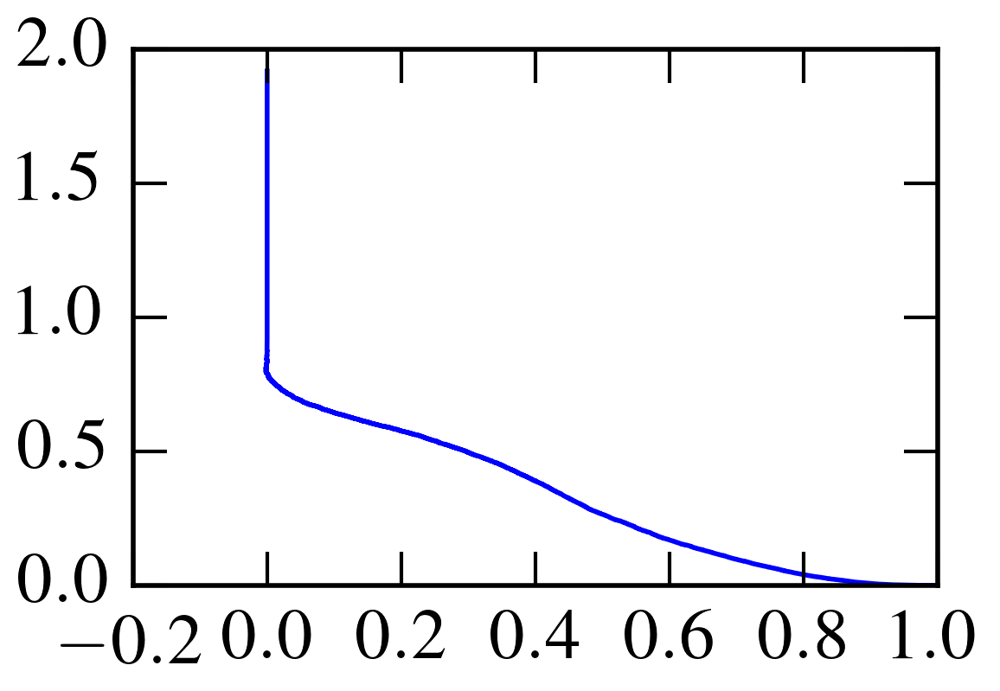

In [46]:
plt.plot(x,thr)

In [45]:
roc_auc_score(test_lbl, probs, sample_weight=test.weights)

0.90392478223682104


variable "test" not defined.

variable "test.weights)" not defined.


In [10]:
from rep import utils

In [70]:
ret = utils.get_efficiencies(probs[test_lbl], test.D0_Loki_BPVLTIME[test_lbl], sample_weight=test.weights[test_lbl], errors=True)

In [75]:
ret = utils.get_efficiencies?


tab completion not implemented for this context


In [ ]:
ret = utils.get_efficiencies

In [72]:
x_val, eff, eff_err, xerr = ret.items()[0][1]

<Container object of 3 artists>

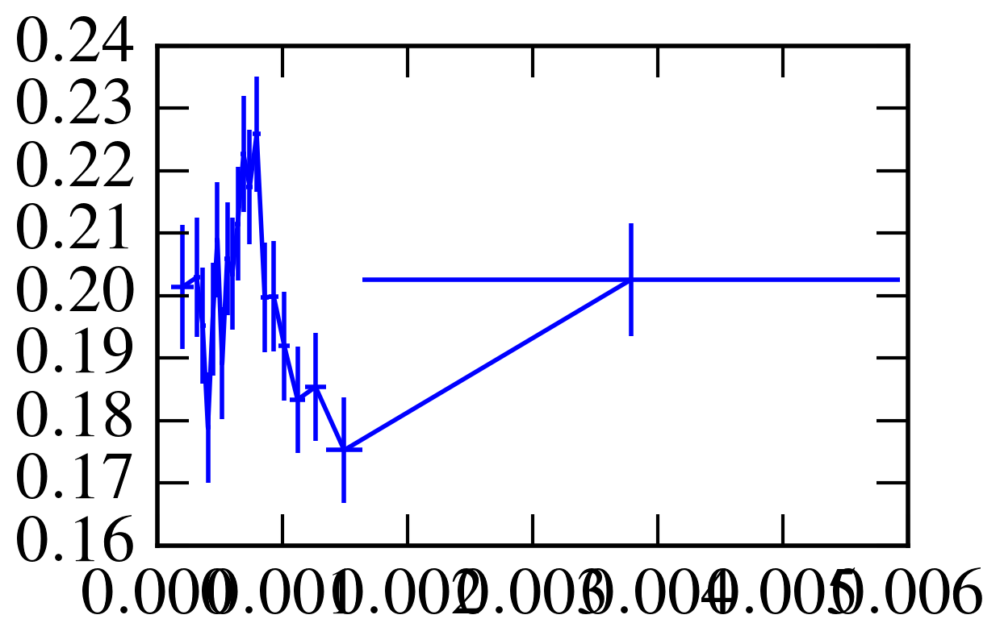

In [74]:
plt.errorbar(x_val, eff, eff_err, xerr)

In [56]:
data_ws['bdt'] = probs_ws

In [49]:
with MODE('MagBoth', 2015, 'WS'):
    mode = gcm()
    data_ws = mode.get_data(features + [vars.ltime(mode.D0), vars.m(mode.D0), vars.dtf_dm()])
    sel = selection.full_selection()
    data_ws = data_ws[sel]
    add_variables.append_phsp(data_ws)
    uniform_features = [vars.ltime(mode.D0)]

In [53]:
probs_ws = bdt.predict_proba(data_ws).transpose()[1]

In [51]:
# Random split using sweights
np.random.seed(42)
labels_ws = (np.random.rand(len(data_ws)) < 0.5)
sweights_ws = mass_fitting.get_sweights(mode)
sweights_ws['bkg'] = sweights_ws.rnd + sweights_ws.comb
data_ws['weights'] = (labels_ws)*sweights_ws.sig.values + (~labels_ws)*sweights_ws.bkg.values

In [54]:
x,y,thr = roc_curve(labels_ws, probs_ws, sample_weight=data_ws.weights)

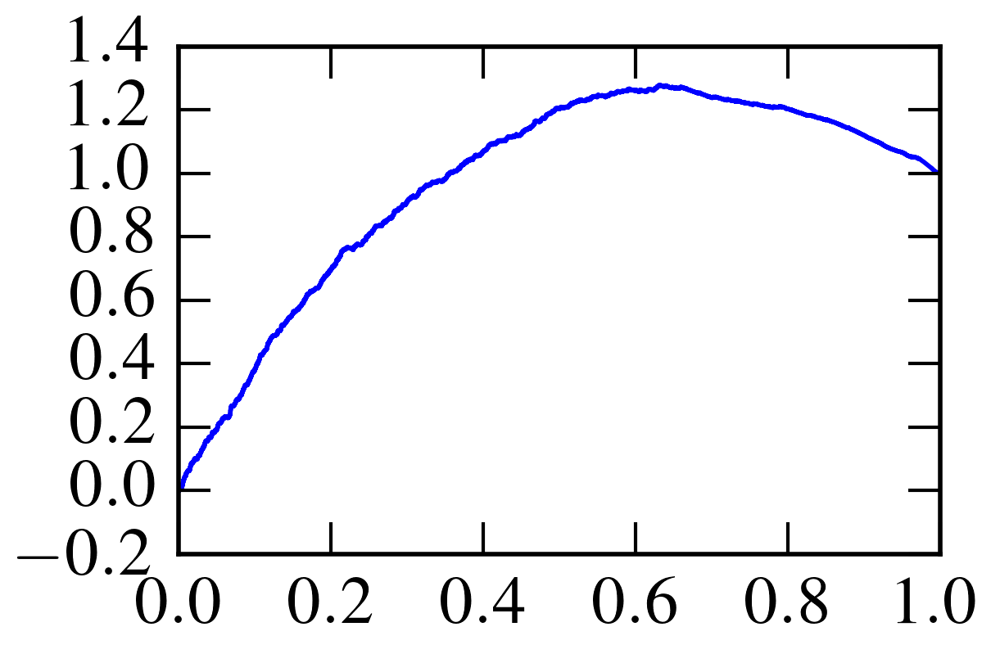

In [55]:
plt.plot(x,y)

In [39]:
probs_ws2 = bdt.predict_proba(data_ws).transpose()[1]

array([[  1.29009001e+04,   1.09915209e-01,   2.26927067e+03, ...,
          3.73474495e+02,   1.17029362e+03,   4.95668235e+01],
       [  5.43733298e+03,   6.18187180e+00,   9.78152184e+02, ...,
          2.81705549e+02,   5.04473235e+02,   8.84231185e+00],
       [  5.68401571e+03,   2.25822109e+00,   1.73061251e+02, ...,
          1.04216127e+03,   3.26045414e+02,   8.39161954e-01],
       ..., 
       [  8.22358241e+03,   2.67816284e-01,   8.87092815e+01, ...,
          6.62981482e+02,   4.41955163e+02,   6.91190864e-01],
       [  5.04646043e+03,   9.49657206e-01,   4.03205333e+01, ...,
          5.28798248e+02,   3.80497130e+02,   1.25616276e+00],
       [  7.02129058e+03,   2.02890320e+00,   9.79427259e+02, ...,
          8.14588894e+02,   9.48455110e+02,   1.17556246e-01]])

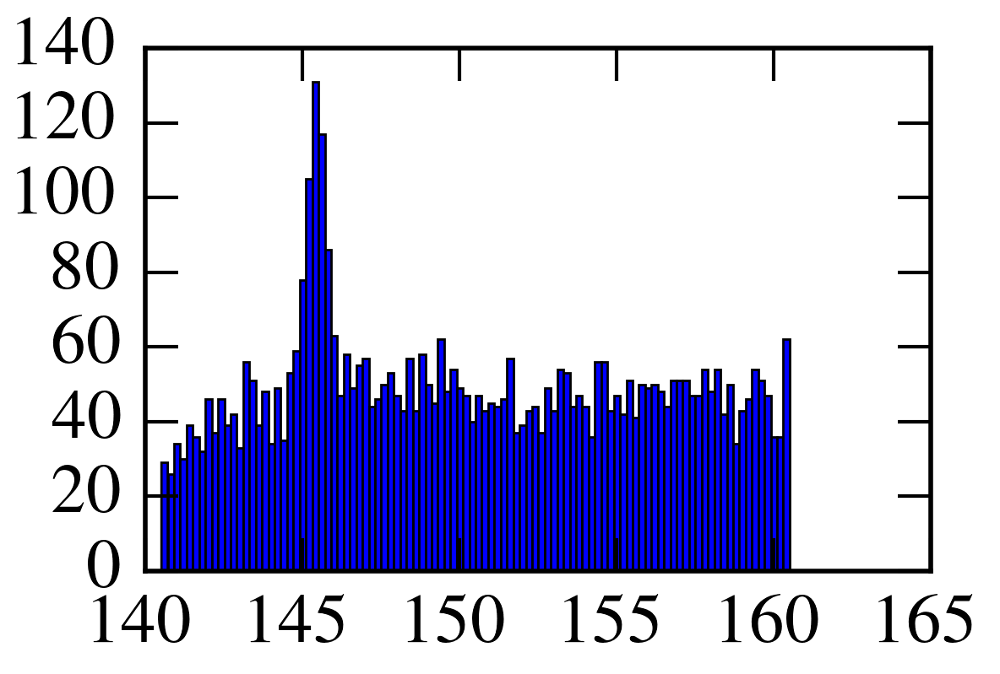

In [64]:
plt.hist(data_ws.delta_m_dtf[data_ws.bdt>0.658], bins=100);

In [48]:
data_ws.delta_m_dtf.max()

6577.8636711825766